### Setup

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from scipy import stats
import statsmodels.api as sm

In [2]:
local_path=r'C:/Users/ddrye/OneDrive/Documents/OMSA_Program/OMSA 2023/Summer2023/Practicum/off_git/data/'
df=pd.read_csv(local_path+r"2014_2020_all_tract.csv")

df=df.query('socioeconomic >= 0 & household_comp >= 0 & minority_status >= 0 & housing_type >= 0 and overall_svi >=0')

pd.set_option('display.max_columns', None)
print('shape:',df.shape)
display(df.head(2))

shape: (481356, 31)


,longitude,latitude,FIPS,avg_co2,year,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS.1,LOCATION,year.1,total_population,housing_units,num_households,unemployment,socioeconomic,household_comp,minority_status,housing_type,overall_svi,xco2_std,co2_1yr_change,co2_6yr_change,co2_1yr_pct_change,co2_6yr_pct_change,co2_5yr_pct_change,co2_4yr_pct_change,co2_3yr_pct_change,co2_2yr_pct_change
0,-74.5,40.5,34005702808,400.576686,2015,34.0,New Jersey,NJ,34005.0,Burlington,34005702808,"Census Tract 7028.08, Burlington County, New J...",2015,3198.5,1113.0,1052.5,235.0,0.67105,0.72955,0.84655,0.1561,0.60690,2.817643,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-74.5,40.5,34005702808,410.654556,2019,34.0,New Jersey,NJ,34005.0,Burlington,34005702808,"Census Tract 7028.08, Burlington County, New J...",2019,3415.0,1138.5,1055.5,120.5,0.57505,0.75375,0.85460,0.0660,0.46885,2.893552,10.077871,NaN,0.025158,NaN,NaN,NaN,NaN,NaN


### Scatter Plots

,total_population,housing_units,num_households,unemployment,socioeconomic,household_comp,minority_status,housing_type,overall_svi,avg_co2
4,3383.0,1136.0,1058.0,164.0,0.5653,0.8186,0.7807,0.0617,0.4835,408.250298
11,1793.0,866.0,679.0,88.0,0.9667,0.7662,0.5766,0.4665,0.8189,407.613775
19,3570.0,1543.0,1093.0,81.0,0.8664,0.8827,0.9477,0.9450,0.9774,407.924700
27,2814.0,1168.0,1091.0,66.0,0.2612,0.0870,0.8088,0.4539,0.3379,409.004763
30,9598.0,2986.0,2725.0,271.0,0.6862,0.4500,0.9136,0.6899,0.7647,408.517255
...,...,...,...,...,...,...,...,...,...,...
485334,6659.0,2608.0,2594.0,95.0,0.0431,0.4309,0.4168,0.0324,0.0566,408.167809
485344,2768.0,1245.0,1136.0,84.0,0.3769,0.2781,0.1552,0.2880,0.2234,408.652430
485351,3783.0,1586.0,1395.0,245.0,0.7178,0.7037,0.2350,0.1821,0.4692,407.760587
485358,2629.0,892.0,892.0,35.0,0.1209,0.2289,0.8467,0.0908,0.1778,409.004763


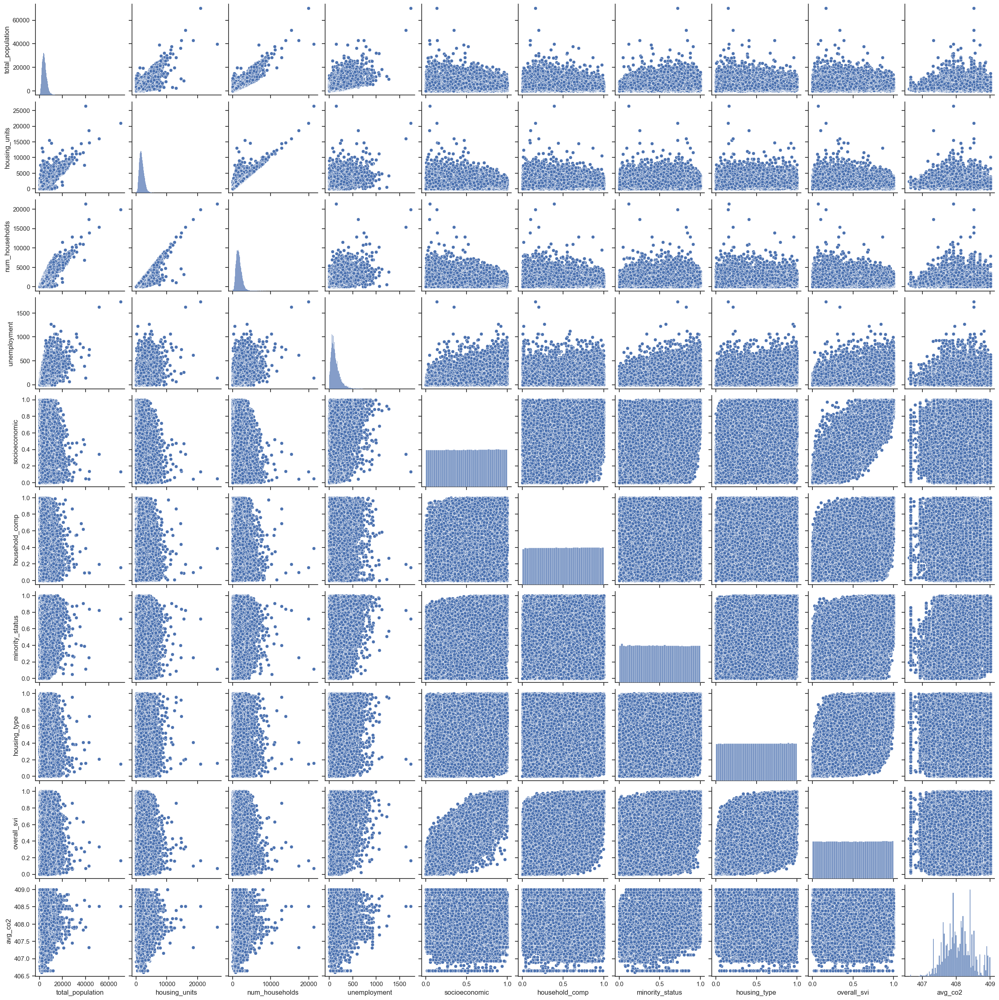

In [3]:
df_2018=df.query('year==2018')
df_2018=df_2018[['total_population','housing_units','num_households','unemployment','socioeconomic','household_comp','minority_status','housing_type','overall_svi','avg_co2']]
display(df_2018)
sns.set_theme(style="ticks")
sns.pairplot(df_2018)

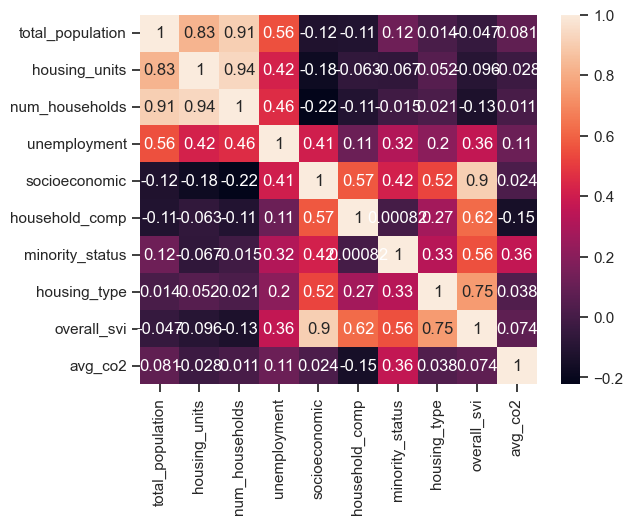

In [4]:
ax = sns.heatmap(df_2018.corr(), annot=True)

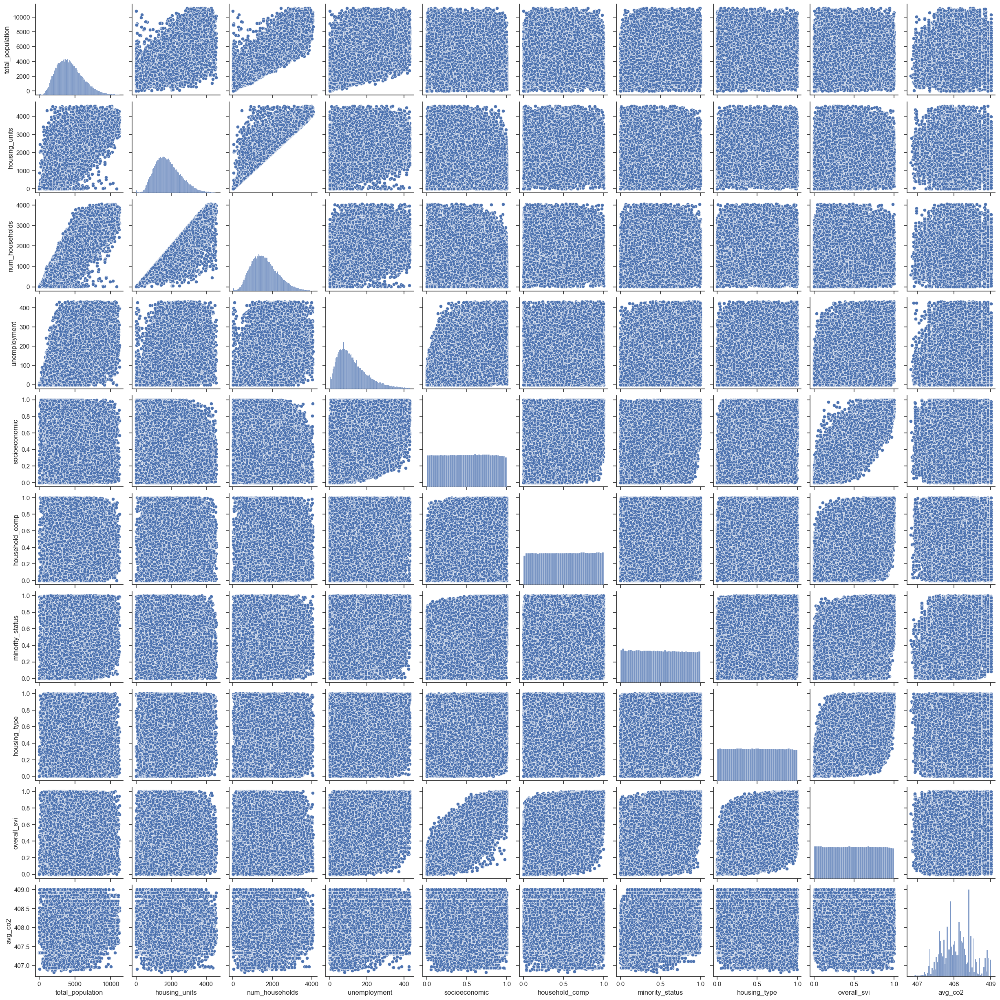

In [5]:
df_2018_wo_outliers=df_2018[(np.abs(stats.zscore(df_2018)) < 3).all(axis=1)]

df_2018_wo_outliers.to_csv(local_path+'df_regression.csv', index=False)

sns.set_theme(style="ticks")
sns.pairplot(df_2018_wo_outliers)


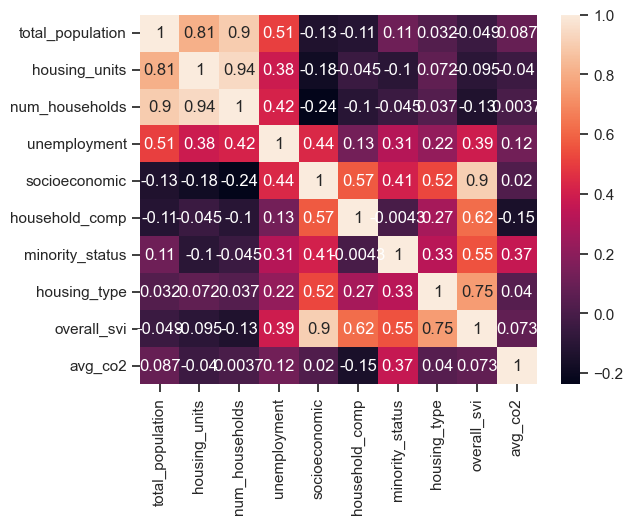

In [6]:
ax = sns.heatmap(df_2018_wo_outliers.corr(), annot=True)

In [7]:
x=df_2018_wo_outliers[['total_population','housing_units','num_households','unemployment','socioeconomic','household_comp','minority_status','housing_type','overall_svi']]
y=df_2018_wo_outliers['avg_co2']


model1 = LinearRegression()  
model1.fit(x, y)

X2 = sm.add_constant(x)
est = sm.OLS(y, X2)
est2 = est.fit()
display(est2.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                avg_co2   R-squared:                       0.169
Model:                            OLS   Adj. R-squared:                  0.169
Method:                 Least Squares   F-statistic:                     1575.
Date:                Tue, 04 Jul 2023   Prob (F-statistic):               0.00
Time:                        12:44:55   Log-Likelihood:                -31048.
No. Observations:               69724   AIC:                         6.212e+04
Df Residuals:                   69714   BIC:                         6.221e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const              407.9672      0.010   4.24e+04      0.000     407.948     407.986
total_population   2.74e-05   1.95e-06     14.026      0.000    2.36e-05    3.12e-05
housing_units    -3.168e-05   5.92e-06     -5.355      0.000   -4.33e-05   -2.01e-05
num_households   -7.013e-05   8.78e-06     -7.990      0.000   -8.73e-05   -5.29e-05
unemployment         0.0004   2.59e-05     16.717      0.000       0.000       0.000
socioeconomic       -0.2101      0.024     -8.727      0.000      -0.257      -0.163
household_comp      -0.1155      0.013     -8.598      0.000      -0.142      -0.089
minority_status      0.5362      0.013     42.018      0.000       0.511       0.561
housing_type         0.0058      0.017      0.337      0.736      -0.028       0.040
overall_svi         -0.0042      0.046     -0.092      0.927      -0.094       0.086
==============================================================================
Omnibus:                     1334.210   Durbin-Watson:                   1.824
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              796.021
Skew:                          -0.101   Prob(JB):                    1.40e-173
Kurtosis:                       2.517   Cond. No.                     2.11e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.11e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

$R^2$ indicates that approx 16.9 of the variance of the model is explained by the predictors

